In [1]:
import pandas as pd
import requests
import json
from sklearn.linear_model import LinearRegression
import numpy as np
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Reemplaza 'archivo.csv' con la ubicación y el nombre de tu archivo CSV
archivo_csv = 'datasets_variables_seleccionadas/df_database_maestro.csv'

# Carga el archivo CSV en un DataFrame
datos_crudos = pd.read_csv(archivo_csv)

# Ahora 'df' es un DataFrame que contiene los datos del archivo CSV
datos_crudos

,País,Año,"Birth rate, crude (per 1,000 people)",CO2 emissions (kg per PPP $ of GDP),Capital health expenditure (% of GDP),"Compulsory education, duration (years)",Control of Corruption: Estimate,"Current health expenditure per capita, PPP (current international $)","Death rate, crude (per 1,000 people)",Domestic general government health expenditure (% of GDP),...,Prevalence of overweight (% of adults),"Prevalence of overweight, weight for height (% of children under 5)",Prevalence of undernourishment (% of population),Rural population (% of total population),"Unemployment, total (% of total labor force) (modeled ILO estimate)",Urban population,Urban population (% of total population),Gasto público social según la clasificación por funciones del gobierno (en moneda nacional a precios corrientes),Prevalence of raised blood glucose/diabetes in adults (%),Proportion of adults who are obese
0,Argentina,1990,21.989000,0.427859,0.0,8.175385,-0.307430,18.598630,7.743000,2.314777,...,48.700000,0.0,0.0,13.016,13.93446,28389540.0,86.984,7055.000000,0.0,16.600000
1,Argentina,1991,21.844000,0.400371,0.0,8.384615,-0.309380,96.672061,7.536000,2.462353,...,49.300000,0.0,0.0,12.672,5.44000,28910601.0,87.328,18537.000000,0.0,17.000000
2,Argentina,1992,21.683000,0.369563,0.0,8.593846,-0.311330,174.745492,7.595000,2.609929,...,49.900000,0.0,0.0,12.458,6.36000,29386348.0,87.542,21688.000000,0.0,17.400000
3,Argentina,1993,21.570000,0.340845,0.0,8.803077,-0.313281,252.818923,7.631000,2.757505,...,50.500000,0.0,0.0,12.248,10.10000,29859584.0,87.752,21534.000000,0.0,17.800000
4,Argentina,1994,21.419000,0.320044,0.0,9.012308,-0.315231,330.892354,7.403000,2.905081,...,51.100000,11.1,0.0,12.040,11.76000,30336257.0,87.960,25661.000000,0.0,18.200000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
754,"Venezuela, RB",2018,17.832000,0.284435,0.0,17.000000,-1.512038,638.613417,6.864000,1.245631,...,65.036203,6.4,22.7,11.792,5.02000,26308612.0,88.208,306539.485887,9.5,31.398453
755,"Venezuela, RB",2019,16.888000,0.276202,0.0,17.000000,-1.527599,469.134286,7.017000,0.811753,...,65.546764,6.4,24.9,11.760,5.09200,25564613.0,88.240,306539.485887,9.5,31.398453
756,"Venezuela, RB",2020,16.213000,0.267968,0.0,17.000000,-1.576018,590.119233,7.575000,1.676635,...,66.057326,6.4,22.9,11.721,7.53000,25151087.0,88.279,306539.485887,9.5,31.398453
757,"Venezuela, RB",2021,15.877000,0.259735,0.0,17.000000,-1.622492,717.755101,7.277060,1.354660,...,66.567888,6.4,22.9,11.675,6.47100,24907533.0,88.325,306539.485887,9.5,31.398453


In [3]:
# Reemplaza 'archivo.csv' con la ubicación y el nombre de tu archivo CSV
archivo2_csv = 'datasets_variables_seleccionadas/correlaciones_top15.csv'

# Carga el archivo CSV en un DataFrame
df_correlaciones = pd.read_csv(archivo2_csv)

# Ahora 'df' es un DataFrame que contiene los datos del archivo CSV
df_correlaciones

,País,Indicadores,Correlaciones
0,Argentina,"Mortality rate, adult, female (per 1,000 femal...",0.988452
1,Argentina,"Mortality rate, adult, male (per 1,000 male ad...",0.987610
2,Argentina,Rural population (% of total population),0.962323
3,Argentina,"Population ages 80 and above, female",0.959173
4,Argentina,"Population ages 80 and above, male",0.957784
...,...,...,...
340,"Venezuela, RB","Fertility rate, total (births per woman)",0.276437
341,"Venezuela, RB","Current health expenditure per capita, PPP (cu...",0.258623
342,"Venezuela, RB",Domestic private health expenditure (% of curr...,0.243138
343,"Venezuela, RB",Gini index,0.218464


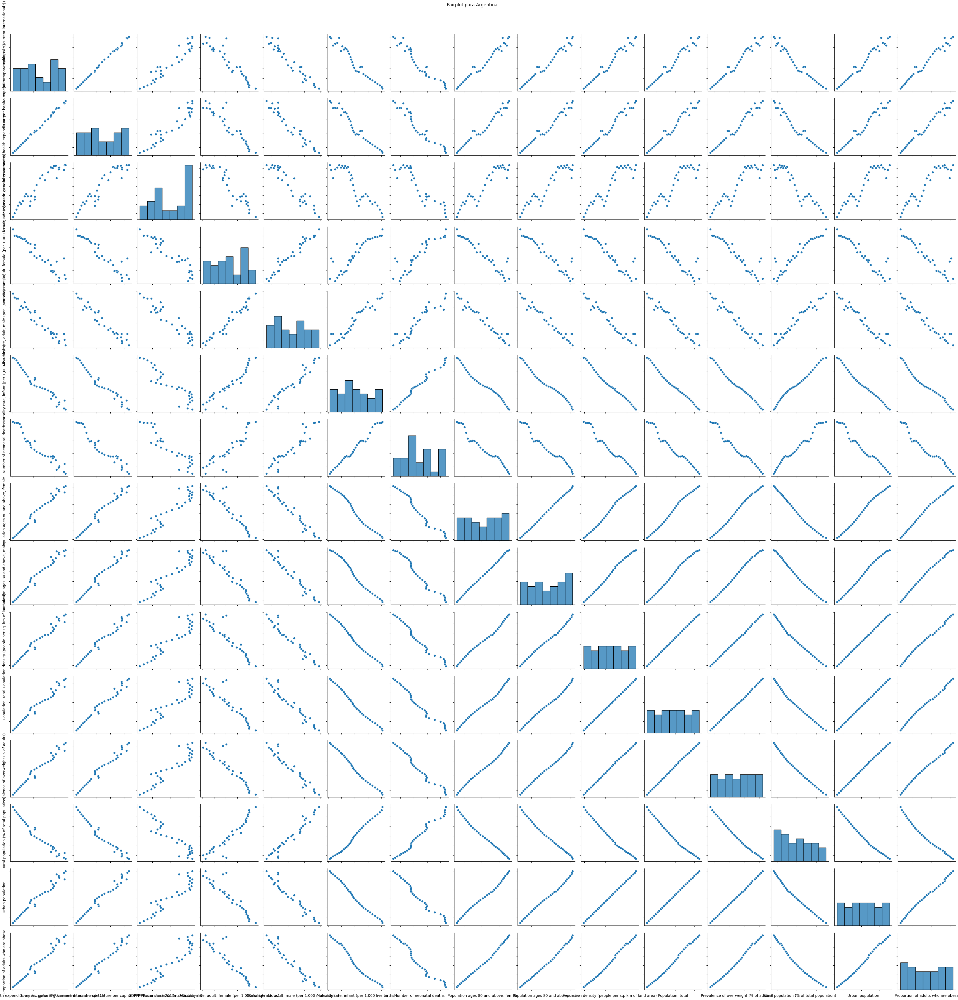

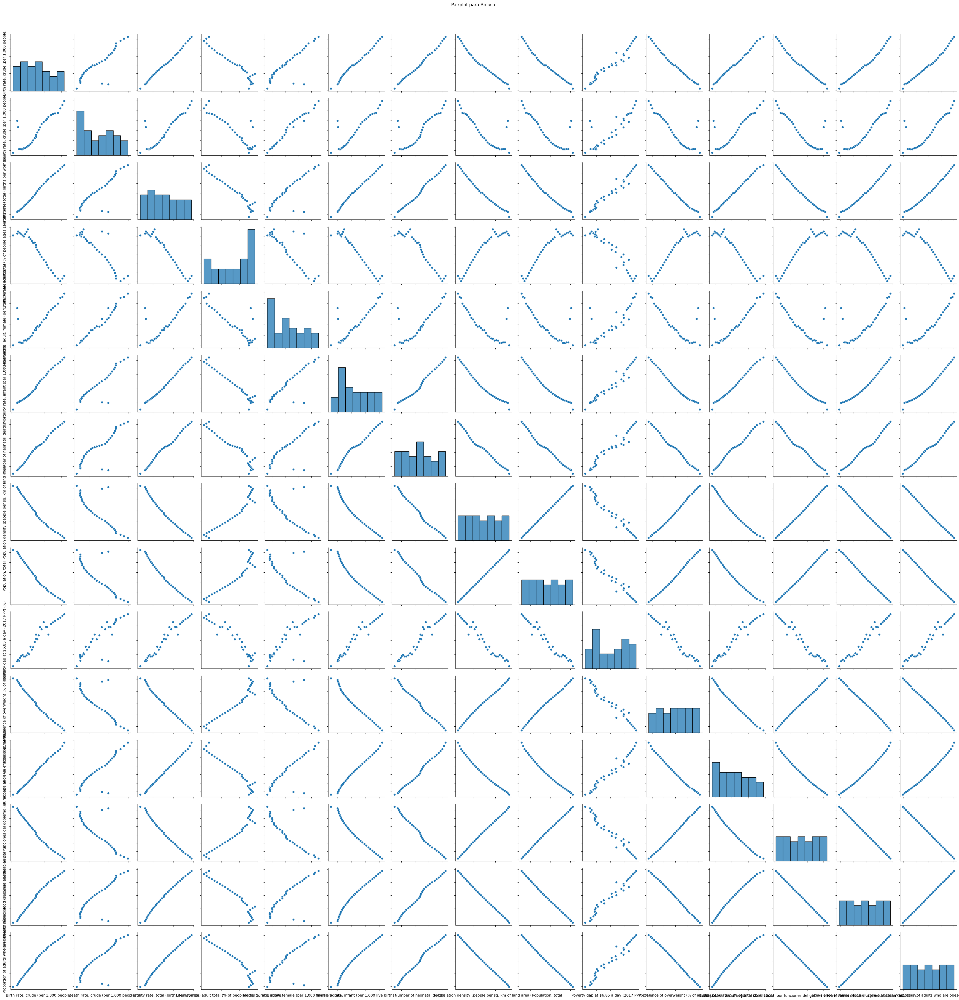

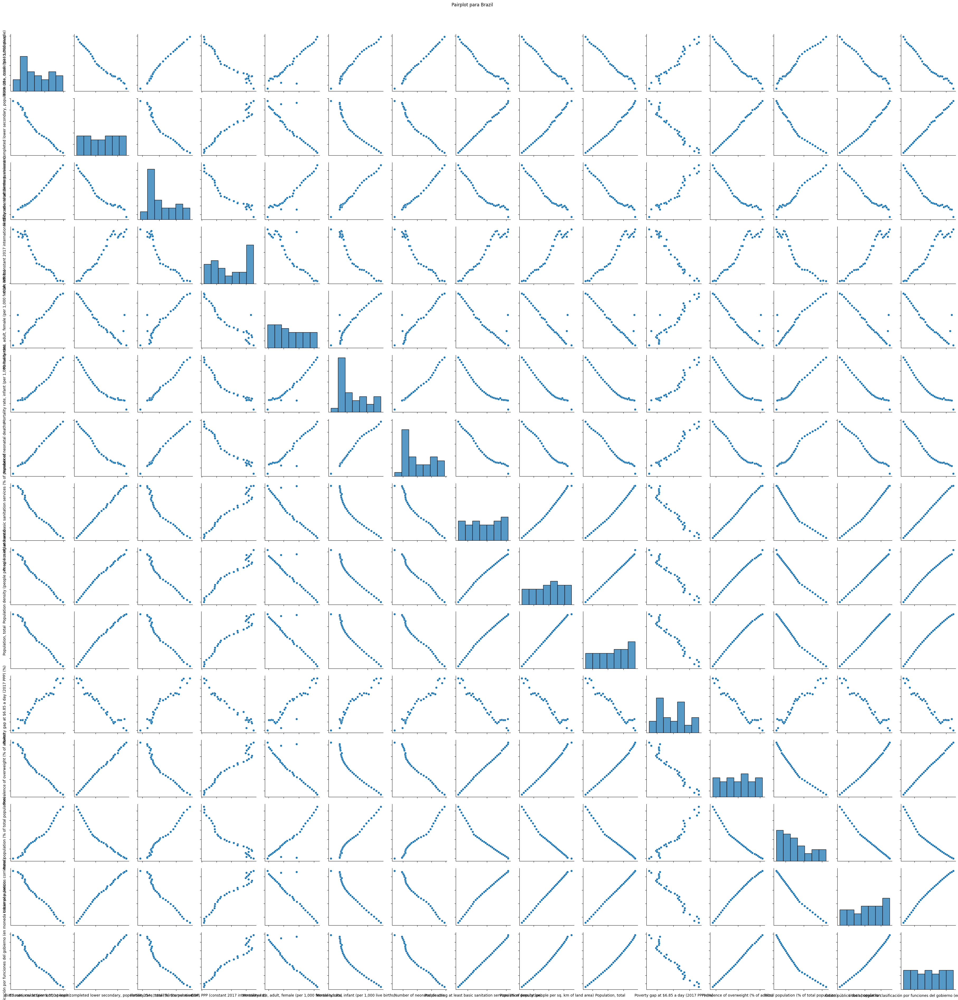

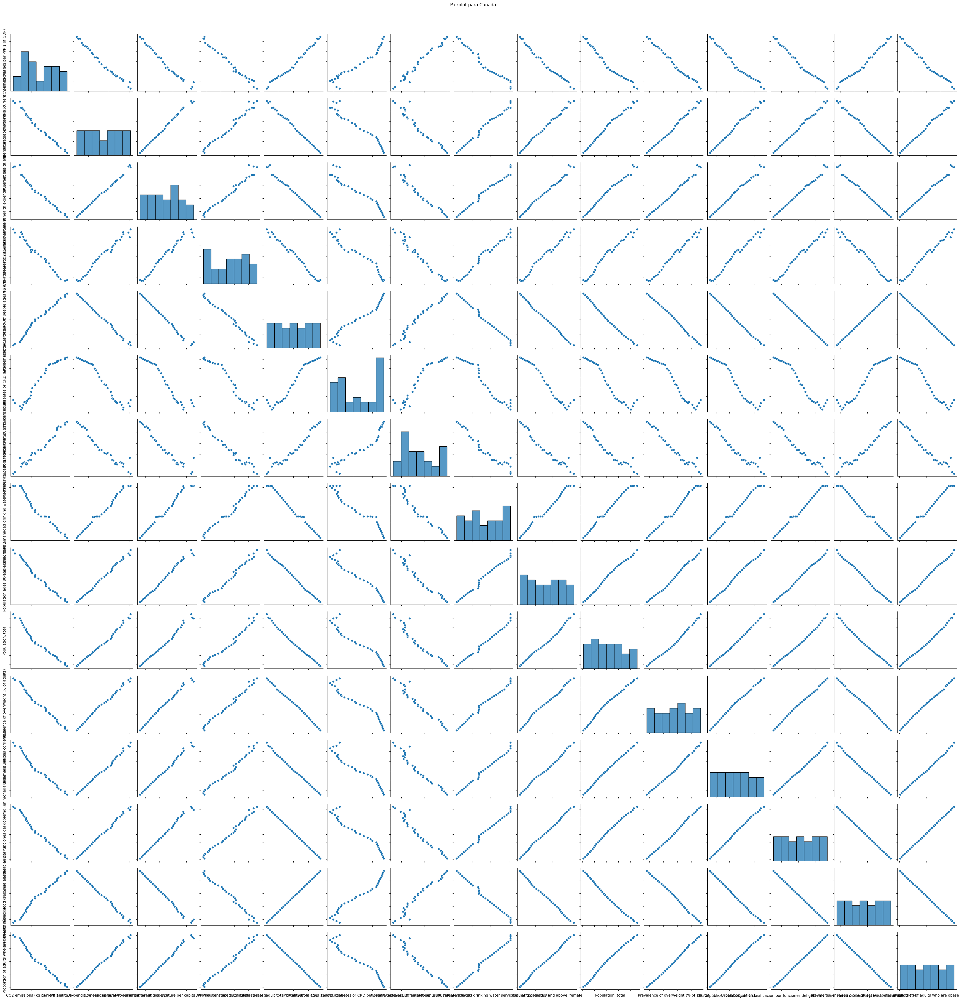

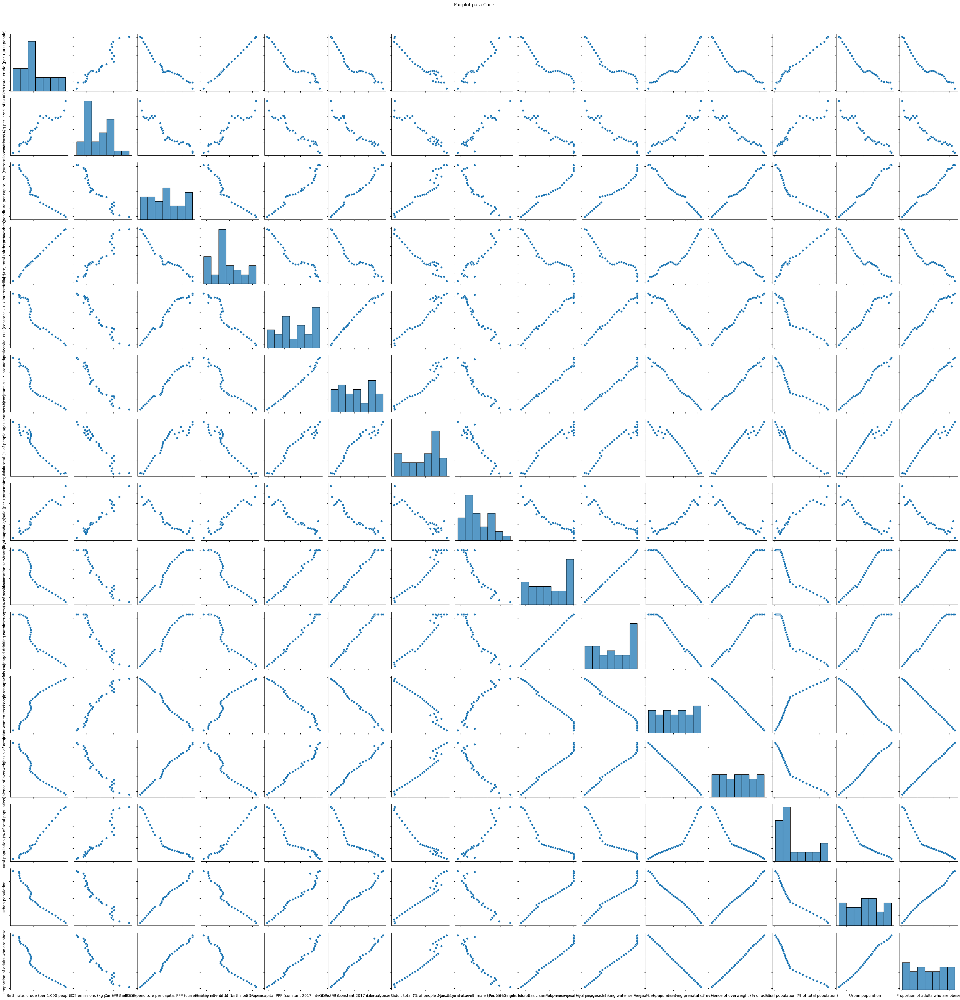

...

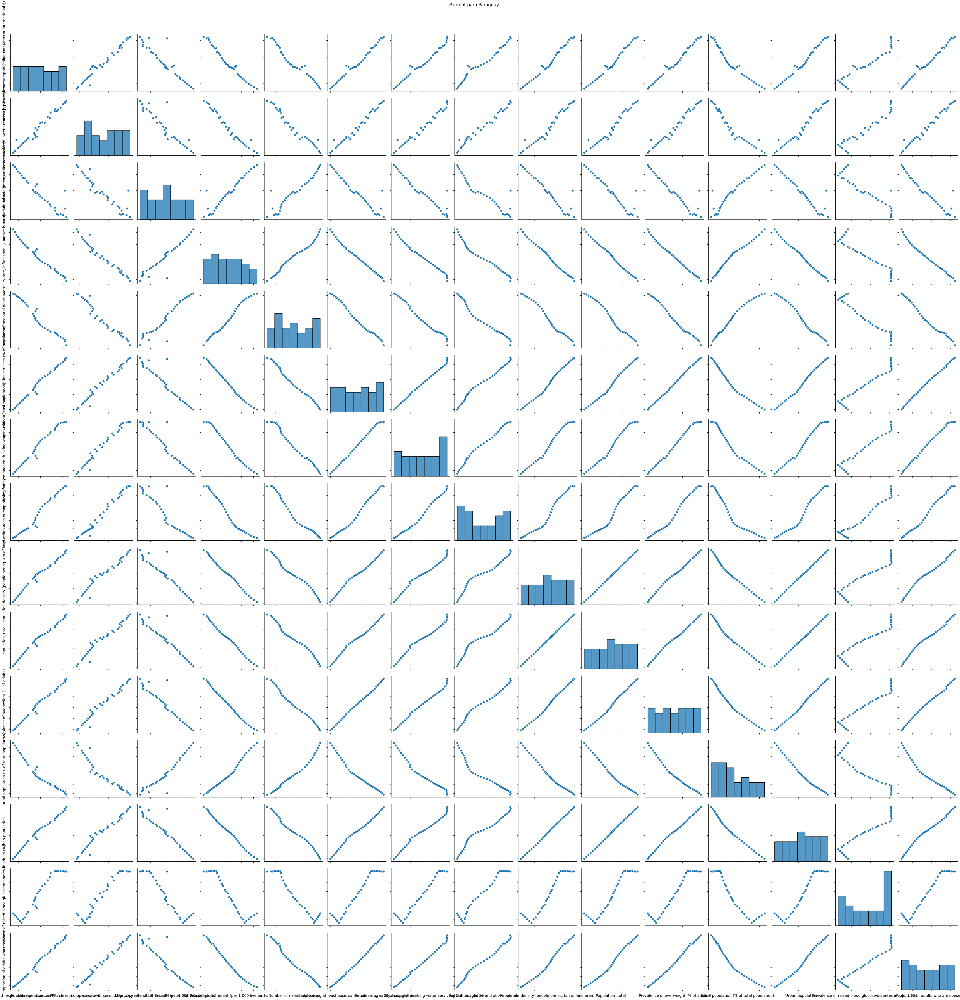

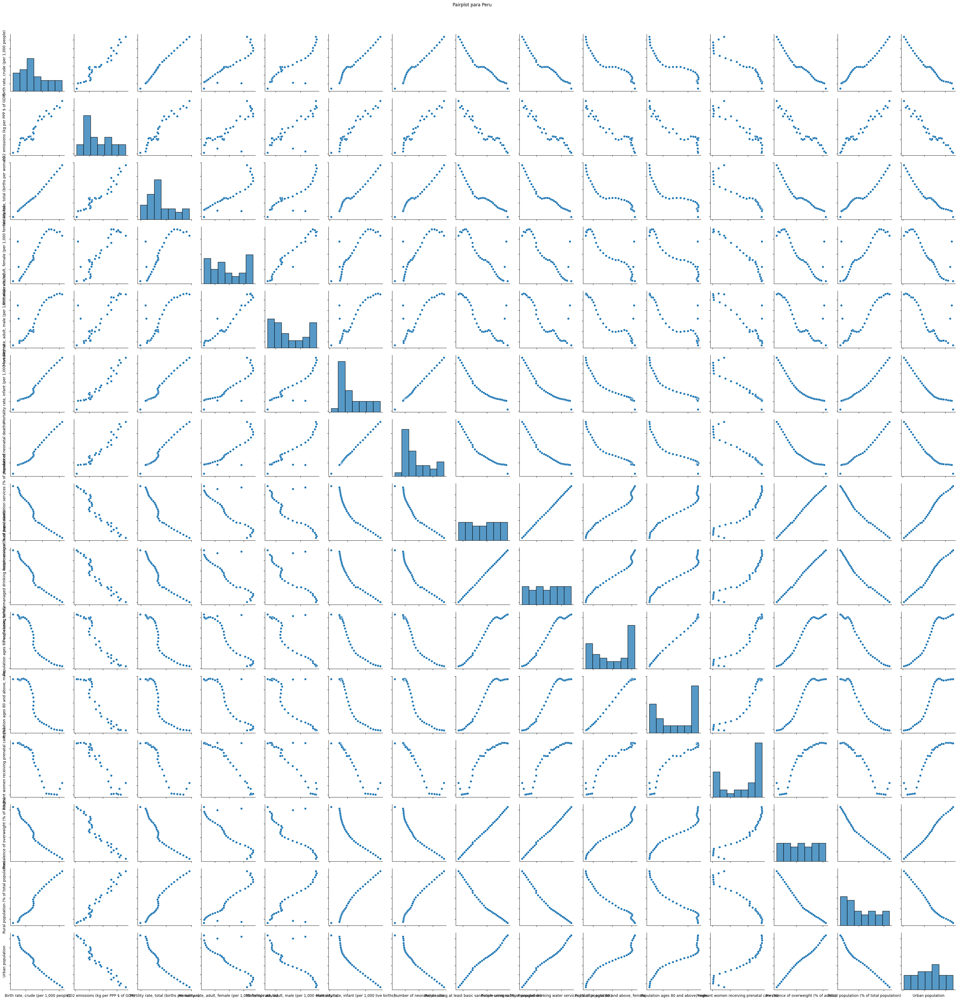

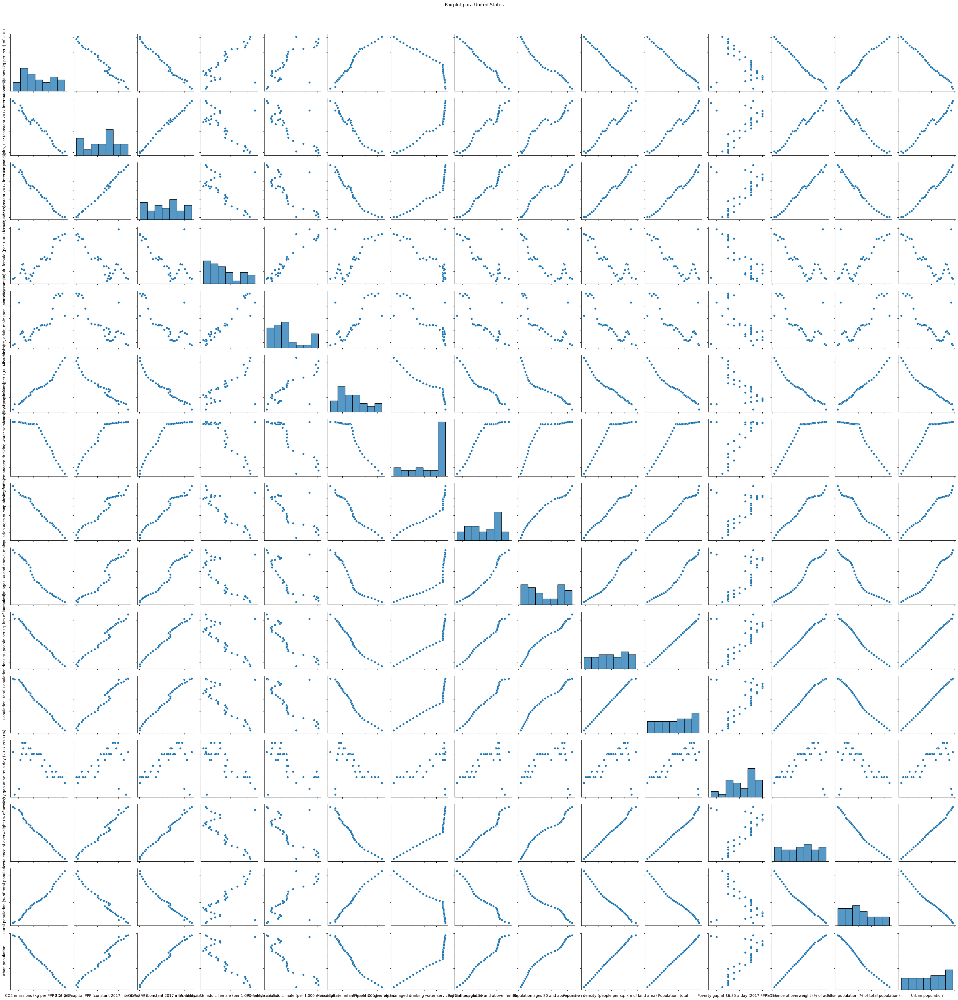

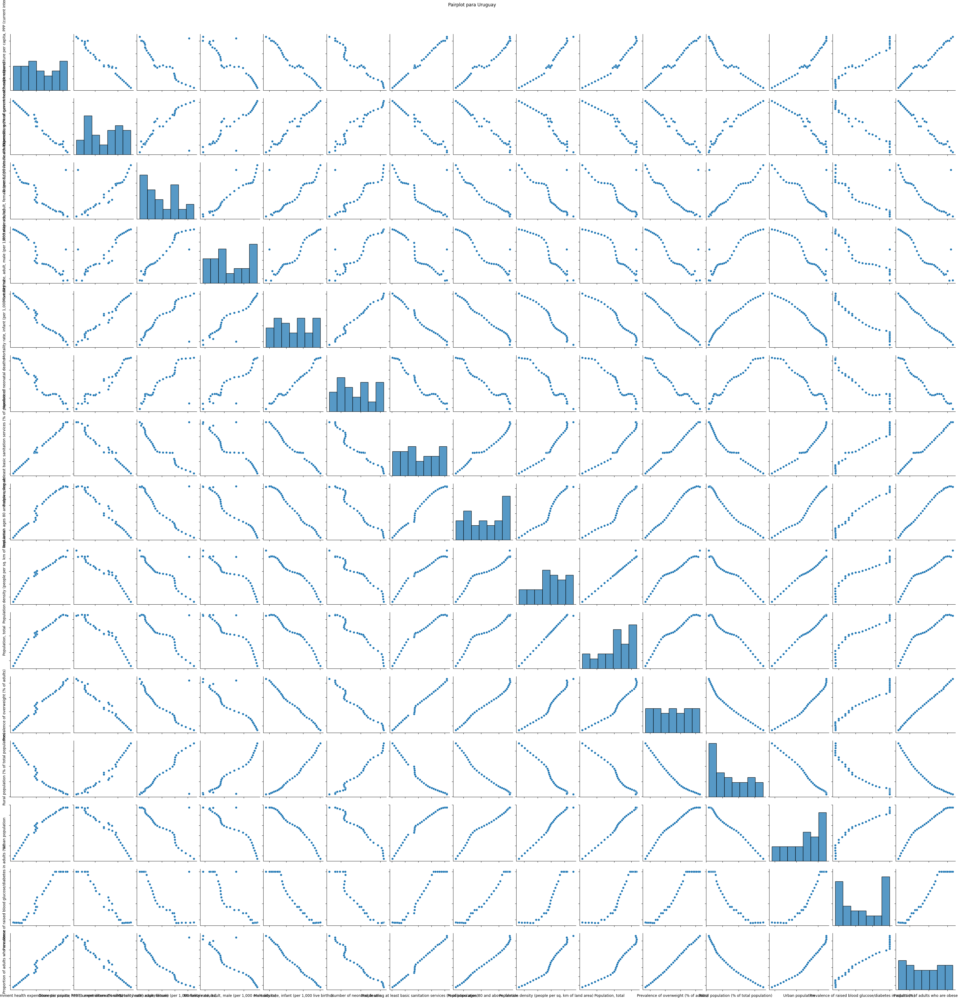

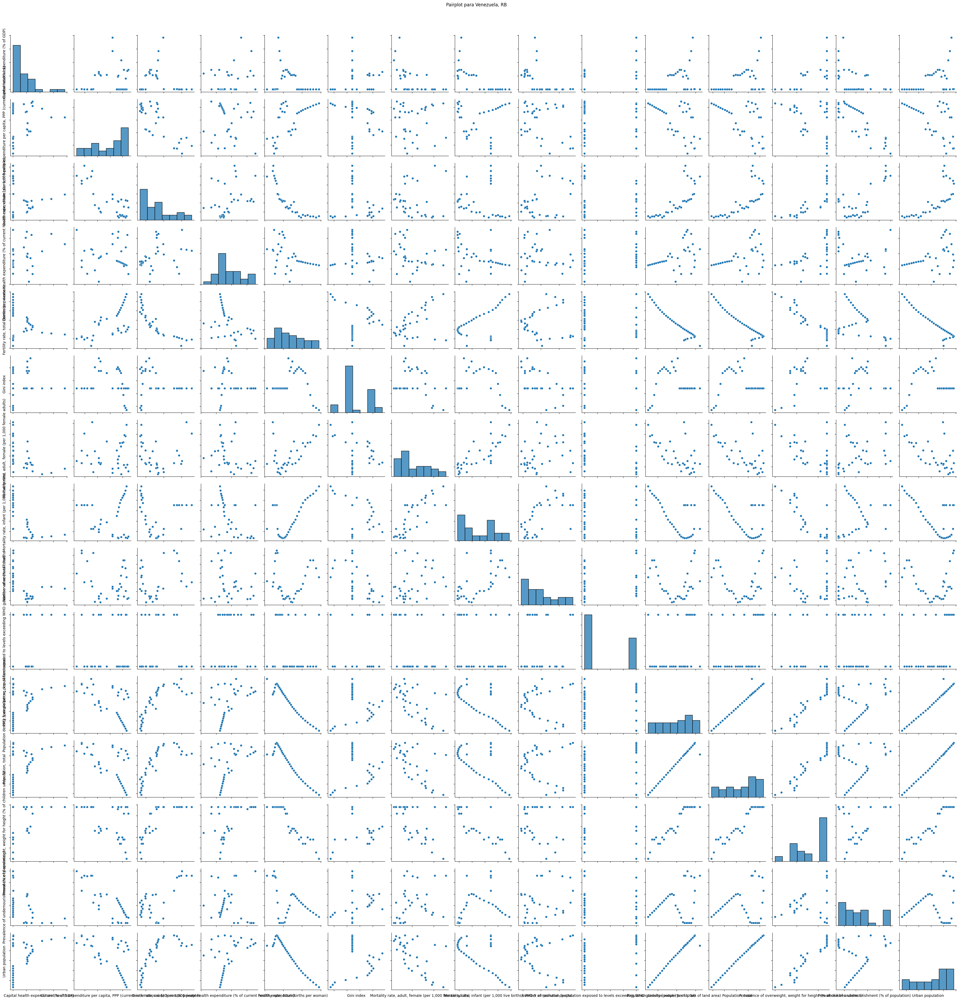

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Lista de países únicos en tus DataFrames
paises = datos_crudos['País'].unique()

# Crear tablas de las mejores relaciones para cada país
mejores_relaciones_por_pais = {}

for pais in paises:
    df_crudos_pais = datos_crudos[datos_crudos['País'] == pais]
    df_correlaciones_pais = df_correlaciones[df_correlaciones['País'] == pais]

    columnas_coincidentes = df_crudos_pais.columns[df_crudos_pais.columns.isin(df_correlaciones_pais['Indicadores'])]
    df_pais_coincidentes = df_crudos_pais[columnas_coincidentes]

    # Calcular las correlaciones entre variables
    correlaciones = df_pais_coincidentes.corr()

    # Encontrar las combinaciones con las correlaciones más altas
    correlaciones_maximas = correlaciones.unstack().sort_values(ascending=False)
    mejores_relaciones = correlaciones_maximas[(correlaciones_maximas < 1) & (correlaciones_maximas >= 0.7)]

    # Guardar las mejores relaciones en un diccionario
    mejores_relaciones_por_pais[pais] = mejores_relaciones

    # Generar pairplot y mostrar el título
    pair_plot = sns.pairplot(df_pais_coincidentes)
    for ax in pair_plot.axes.flat:
        ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
        ax.set_yticklabels(ax.get_yticklabels(), rotation=0)
    plt.suptitle(f'Pairplot para {pais}', y=1.02)
    plt.show()


Las mejores relaciones de variables:
Population, total                                        Population density (people per sq. km of land area)                  0.999996
Population density (people per sq. km of land area)      Population, total                                                    0.999996
Birth rate, crude (per 1,000 people)                     Number of neonatal deaths                                            0.999665
Number of neonatal deaths                                Birth rate, crude (per 1,000 people)                                 0.999665
Prevalence of overweight (% of adults)                   People using at least basic sanitation services (% of population)    0.999657
                                                                                                                                ...   
Mortality rate, infant (per 1,000 live births)           Mortality rate, adult, female (per 1,000 female adults)              0.878262
CO2 emissions (kg 

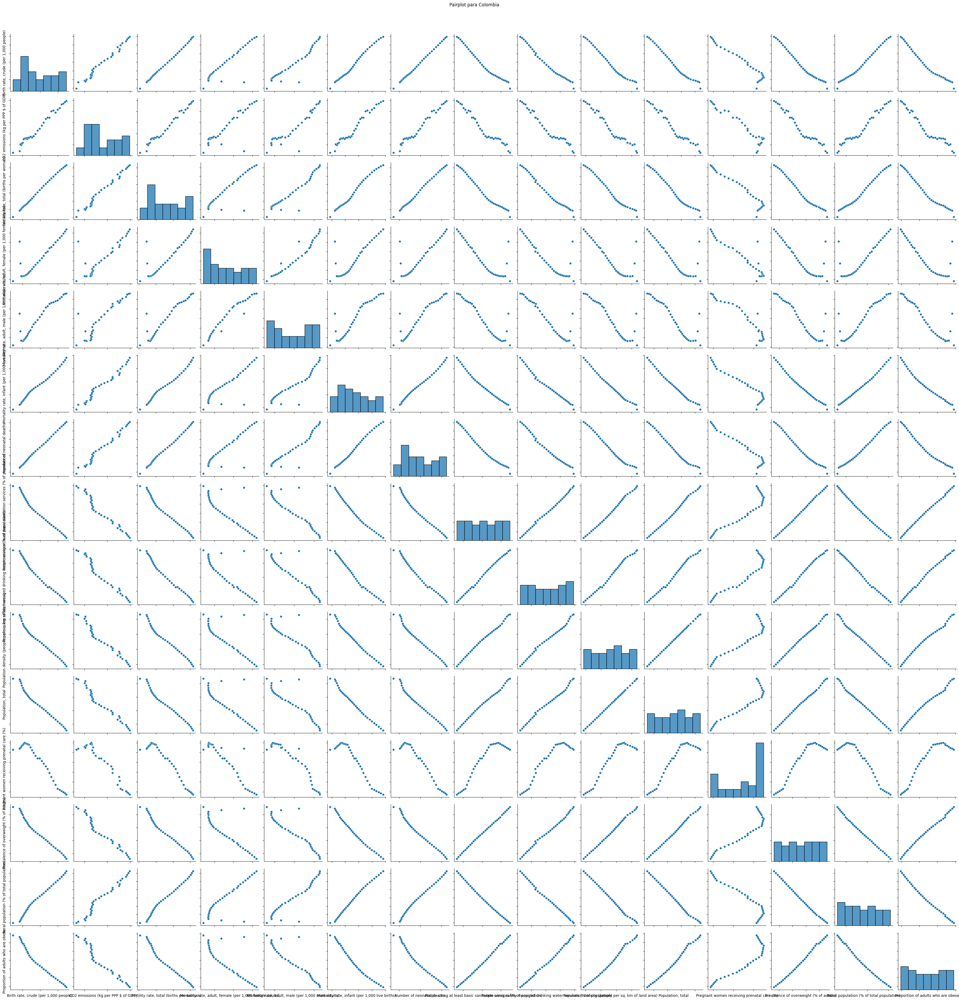

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Filtrar y crear un pairplot solo para Argentina
pais = 'Colombia'
df_crudos_pais = datos_crudos[datos_crudos['País'] == pais]
df_correlaciones_pais = df_correlaciones[df_correlaciones['País'] == pais]

columnas_coincidentes = df_crudos_pais.columns[df_crudos_pais.columns.isin(df_correlaciones_pais['Indicadores'])]
df_pais_coincidentes = df_crudos_pais[columnas_coincidentes]

pair_plot = sns.pairplot(df_pais_coincidentes)

# Calcular las correlaciones entre variables
correlaciones = df_pais_coincidentes.corr()

# Encontrar las combinaciones con las correlaciones más altas
correlaciones_maximas = correlaciones.unstack().sort_values(ascending=False)
mejores_relaciones = correlaciones_maximas[(correlaciones_maximas < 1) & (correlaciones_maximas >= 0.7)]

# Mostrar la tabla con las mejores relaciones
print("Las mejores relaciones de variables:")
print(mejores_relaciones)

for ax in pair_plot.axes.flat:
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45)
    ax.set_yticklabels(ax.get_yticklabels(), rotation=0)

plt.suptitle(f'Pairplot para {pais}', y=1.02)  # Establecer el título con el nombre del país
plt.show()
